In [22]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/xen-imputed/best_imputed_xenium.npy
/kaggle/input/breast-cancer-dataset10x-genomics/brca-R.npy
/kaggle/input/breast-cancer-dataset10x-genomics/brca-vi.h5ad
/kaggle/input/breast-cancer-dataset10x-genomics/brca-xe.h5ad


In [23]:
!pip install scanpy anndata

In [25]:
# Load data from the separate files instead of BRCA.dmp
import numpy as np
import scanpy as sc

# Load the three data components from the 20250813 SIID Data Dump folder
vi = sc.read_h5ad("/kaggle/input/breast-cancer-dataset10x-genomics/brca-vi.h5ad")
xe = sc.read_h5ad("/kaggle/input/breast-cancer-dataset10x-genomics/brca-xe.h5ad") 
R = np.load("/kaggle/input/breast-cancer-dataset10x-genomics/brca-R.npy")


# Apply the same preprocessing as the original code
vi.var_names_make_unique()
xe.var_names_make_unique()
if hasattr(vi.X, "toarray"): vi.X = vi.X.toarray()
if hasattr(xe.X, "toarray"): xe.X = xe.X.toarray()



# Verify the loaded data structure
print("Visium data (vi) shape:", vi.shape)
print("Xenium data (xe) shape:", xe.shape)
print("Transformation matrix (R) shape:", R.shape)
print("\nVisium genes (first 10):", list(vi.var_names[:10]))
print("Xenium genes (first 10):", list(xe.var_names[:10]))
print("Common genes:", len(set(vi.var_names).intersection(set(xe.var_names))))


# VISIUM DATA VIEWER - Customizable dimensions
rows = 10  # Change this value to view different number of rows
cols = 10  # Change this value to view different number of columns

print("="*50)
print(f"VISIUM DATA ({rows}x{cols} values):")
print("="*50)
print(f"Total shape: {vi.shape}")
print(f"Row names (first {rows} observations):", list(vi.obs_names[:rows]))
print(f"Column names (first {cols} genes):", list(vi.var_names[:cols]))

# Set numpy print options to show full arrays without truncation
np.set_printoptions(threshold=np.inf, suppress=True)
print("Data values:")
print(vi.X[:rows, :cols])

# Display spatial coordinates if available
if 'spatial' in vi.obsm:
    print(f"\nVisium spatial coordinates (first {min(rows, 10)}):")
    print(vi.obsm['spatial'][:min(rows, 10)])

# Reset numpy print options to default
np.set_printoptions(threshold=1000, suppress=False)


# XENIUM DATA VIEWER - Customizable dimensions
rows = 10  # Change this value to view different number of rows
cols = 10  # Change this value to view different number of columns

print("="*50)
print(f"XENIUM DATA ({rows}x{cols} values):")
print("="*50)
print(f"Total shape: {xe.shape}")
print(f"Row names (first {rows} observations):", list(xe.obs_names[:rows]))
print(f"Column names (first {cols} genes):", list(xe.var_names[:cols]))

# Set numpy print options to show full arrays without truncation
np.set_printoptions(threshold=np.inf, suppress=True)
print("Data values:")
print(xe.X[:rows, :cols])

# Display spatial coordinates if available
if 'spatial' in xe.obsm:
    print(f"\nXenium spatial coordinates (first {min(rows, 10)}):")
    print(xe.obsm['spatial'][:min(rows, 10)])

# Reset numpy print options to default
np.set_printoptions(threshold=1000, suppress=False)

# TRANSFORMATION MATRIX R VIEWER - COMPLETE MATRIX
print("="*50)
print(f"COMPLETE TRANSFORMATION MATRIX R:")
print("="*50)
print(f"Total shape: {R.shape} (rows: Xenium cells, cols: Visium spots)")

# Set numpy print options to show ENTIRE matrix without truncation
np.set_printoptions(threshold=np.inf, suppress=True, linewidth=200)

print("\nComplete R matrix data:")
print("Rows = Xenium cells, Columns = Visium spots")
print(R)

# Reset numpy print options to default
np.set_printoptions(threshold=1000, suppress=False, linewidth=75)

print(f"\nMatrix printed completely: {R.shape[0]} rows × {R.shape[1]} columns")

# R MATRIX DIMENSIONS
print("="*50)
print("R MATRIX DIMENSIONS")
print("="*50)
print(f"R matrix shape: {R.shape}")
print(f"Number of rows (Xenium cells): {R.shape[0]}")
print(f"Number of columns (Visium spots): {R.shape[1]}")
print(f"Total elements: {R.size:,}")
print(f"Memory size: {R.nbytes / (1024**2):.2f} MB")

/usr/local/lib/python3.11/dist-packages/anndata/_core/anndata.py:1798: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Visium data (vi) shape: (4992, 18085)
Xenium data (xe) shape: (167780, 313)
Transformation matrix (R) shape: (3, 3)

Visium genes (first 10): ['SAMD11', 'NOC2L', 'KLHL17', 'PLEKHN1', 'PERM1', 'HES4', 'ISG15', 'AGRN', 'RNF223', 'C1orf159']
Xenium genes (first 10): ['ABCC11', 'ACTA2', 'ACTG2', 'ADAM9', 'ADGRE5', 'ADH1B', 'ADIPOQ', 'AGR3', 'AHSP', 'AIF1']
Common genes: 307
VISIUM DATA (10x10 values):
Total shape: (4992, 18085)
Row names (first 10 observations): ['AACACCTACTATCGAA-1', 'AACACGTGCATCGCAC-1', 'AACACTTGGCAAGGAA-1', 'AACAGGAAGAGCATAG-1', 'AACAGGATTCATAGTT-1', 'AACAGGCCAACGATTA-1', 'AACAGGTTATTGCACC-1', 'AACAGGTTCACCGAAG-1', 'AACAGTCAGGCTCCGC-1', 'AACAGTCCACGCGGTG-1']
Column names (first 10 genes): ['SAMD11', 'NOC2L', 'KLHL17', 'PLEKHN1', 'PERM1', 'HES4', 'ISG15', 'AGRN', 'RNF223', 'C1orf159']
Data values:
[[ 0.  0.  0.  0.  0.  1.  0.  1.  0.  0.]
 [ 2.  0.  0.  0.  0.  0.  0.  4.  0.  0.]
 [ 1.  3.  0.  1.  0.  3. 21. 10.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  2.  2.  0.  0.]
 [ 

In [26]:
# --- This is a new cell, run this before running the modified training ---
# --- (This is the content of your old Cell 17) ---

import numpy as np
import pickle
import os.path

version = 2

score_metrics = ["r2", "pcc", "ssim", "rmse", "js", "nnz"]
score_metrics_vs_src = ["r2", "pcc", "ssim", "rmse", "js"]

def score_corr(x, y, metric = "r2"):
    # All-in-one scoring function. All of them are structured such that larger = better correlation.
    # Flatten ndarray if needed
    if isinstance(x, np.ndarray):
        xf = x.flatten()
    else:
        xf = np.array(x)
    if isinstance(y, np.ndarray):
        yf = y.flatten()
    else:
        yf = np.array(y)
    assert len(xf) == len(yf)
    if (np.any(xf == 0)) or (np.any(yf == 0)):
        if metric == "js":
            xf = xf + 1e-10
            yf = yf + 1e-10
    if (np.std(xf) < 1e-5) or (np.std(yf) < 1e-5):
        if metric in ['r2', 'pcc', 'ssim']:
            return 0
        elif metric == 'rmse':
            return -1
    n = len(xf)
    # The following 5 metrics comes from the Nat Meth paper
    if metric == "r2":
        corr_matrix = np.corrcoef(xf, yf)
        return corr_matrix[0, 1]**2
    elif metric == "pcc":
        mx, my = np.mean(xf), np.mean(yf)
        a = np.mean((xf - mx) * (yf - my))
        b = np.std(xf) * np.std(yf)
        return a / b
    elif metric == "ssim":
        x_, y_ = xf / max(xf), yf / max(yf)
        mx, my = np.mean(x_), np.mean(y_)
        sx, sy = np.std(x_), np.std(y_)
        cov = np.cov(x_, y_)[0][1]
        c1 = 0.01
        c2 = 0.03
        return (2 * mx * my + c1 ** 2) * (2 * cov + c2 ** 2) / (mx ** 2 + my ** 2 + c1 ** 2) / (sx ** 2 + sy ** 2 + c2 ** 2)
    elif metric == "rmse":
        mx, my = np.mean(xf), np.mean(yf)
        sx, sy = np.std(xf), np.std(yf)
        zx = (xf - mx) / sx
        zy = (yf - my) / sy
        avg = np.mean((zx - zy) ** 2)
        return - (avg ** 0.5)
    elif metric == "js":
        xf = xf / sum(xf)
        yf = yf / sum(yf)
        return - (np.sum(xf * np.log(xf / yf)) + np.sum(yf * np.log(yf / xf))) / 2
    elif metric == "nnz":
        # A custom metric. It works as follows: Identify non-zero elements in x, and estimate the overlap between the indices
        # and the top-N indices in y (N = # nnz).
        # Different from everything else: requires x and y to be ordered - x be the observation and y be the estimate.
        nnz = xf > 0.1
        count = sum(nnz)
        if count == 0:
            return 0  # x is all-zero, meaningless
        sorted_est = np.argsort(yf)
        overlap = 0
        for i in sorted_est[-count:]:
            overlap += nnz[i]
        return overlap / count

def avg_corr_by_row(gt, est, met = "r2", eps = 0):
    assert gt.shape == est.shape
    data = []
    for i in range(gt.shape[0]):
        data.append(score_corr(gt[i] + eps, est[i] + eps, metric = met))
    return sum(data) / len(data)

def corr_by_col(gt, est, met = "r2", eps = 0):
    assert gt.shape == est.shape
    data = []
    for i in range(gt.shape[1]):
        data.append(score_corr(gt[:, i] + eps, est[:, i] + eps, metric = met))
    return data

def avg_corr_by_col(gt, est, met = "r2", eps = 0):
    return np.mean(corr_by_col(gt, est, met, eps))

In [27]:
import numpy as np
from scipy.sparse import csr_matrix
from anndata import AnnData
from scipy.spatial import KDTree  # <-- THIS LINE IS THE FIX

def apply(proj, p):
    return proj.dot(np.concatenate((p, [1])))[:2]
    
def batch_apply(proj, ps):
    ret = np.zeros_like(ps)
    for i in range(ps.shape[0]):
        ret[i] = apply(proj, ps[i])
    return ret


def gen_gamma(vi_sp, xe_sp, max_radius = 100, exclusive = True):
    assert exclusive
    ret = np.zeros((xe_sp.shape[0], vi_sp.shape[0]))
    kdt = KDTree(vi_sp) # This will now work
    for i in range(xe_sp.shape[0]):
        d, vi_idx = kdt.query(xe_sp[i])
        if d <= max_radius:
            ret[i, vi_idx] = 1
    return ret

In [28]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from anndata import AnnData
from scipy.sparse import csr_matrix, issparse
import numpy as np

# --- Helper functions (same as before) ---
def to_dense_mat(ad, eps):
    if issparse(ad.X):
        mat = ad.X.toarray()
    else:
        mat = ad.X
    return mat + eps

def convert_to_sparse_csr_tensor(array):
    if not issparse(array):
        array = csr_matrix(array)
    crow_indices = torch.tensor(array.indptr, dtype=torch.int64)
    col_indices = torch.tensor(array.indices, dtype=torch.int64)
    values = torch.tensor(array.data, dtype=torch.float32)
    sparse_csr_tensor = torch.sparse_csr_tensor(crow_indices, col_indices, values, size=array.shape)
    return sparse_csr_tensor.to_sparse()
# ----------------------------------------


class JointAutoencoder(nn.Module):
    """
    NEW VERSION: Non-linear Encoder, Linear Decoder (like NMF's Q matrix)
    
    This avoids building the giant (n_cells, n_total_genes) tensor in memory 
    by calculating the two losses separately.
    
    NOTE: The 'train_model' method has been REMOVED. The training loop
    will now be managed externally by the 'impute_genes' function.
    """
    def __init__(self, xe: AnnData, vi: AnnData, gamma: np.ndarray, n_factors: int, device: str = 'cpu'):
        super().__init__()
        
        self.device = device
        
        # --- Data setup ---
        self.num_xenium_cells = xe.shape[0]
        self.num_visium_spots = vi.shape[0]
        self.num_xenium_genes = xe.shape[1]
        self.num_total_genes = vi.shape[1] # Full transcriptome gene count
        self.n_factors = n_factors

        # Observed data
        self.X = torch.tensor(to_dense_mat(xe, 0), dtype=torch.float32).to(device)
        self.V = torch.tensor(to_dense_mat(vi, 0), dtype=torch.float32).to(device)

        # Spatial mapping matrix (Gamma)
        self.gamma = convert_to_sparse_csr_tensor(gamma).to(device)

        # --- Model Parameters ---
        
        # 1. Encoder (Non-linear P matrix)
        self.encoder = nn.Sequential(
            nn.Linear(self.num_xenium_genes, 128),
            nn.ReLU(),
            nn.Linear(128, self.n_factors),
            nn.Softmax(dim=1) 
        ).to(device)

        # 2. Decoder (Linear Q matrix)
        self.decoder_Q = nn.Parameter(
            torch.randn((self.n_factors, self.num_total_genes), dtype=torch.float32).to(device)
        )
        nn.init.xavier_uniform_(self.decoder_Q)

        # 3. Scaling factors
        self.scale_factor_xenium = nn.Parameter(
            torch.ones((self.num_xenium_cells, 1), dtype=torch.float32).to(device))
        
        self.scale_factor_visium = nn.Parameter(
            torch.ones((self.num_xenium_cells, 1), dtype=torch.float32).to(device))

        self.platform_sf = nn.Parameter(
            torch.zeros((1, self.num_xenium_genes), dtype=torch.float32).to(device))

    
    @property
    def Q_soft(self):
        # Apply non-negativity to the Q matrix (decoder)
        return F.softplus(self.decoder_Q)

    def get_losses(self):
        """
        Calculates the two-part loss in a memory-efficient way.
        """
        # 1. Get latent representation P (small tensor)
        z = self.encoder(self.X)
        
        # --- 2. Imputation Loss (Xenium) ---
        a_x_recon = z @ self.Q_soft[:, :self.num_xenium_genes] 
        a_x_recon_scaled = torch.exp(self.scale_factor_xenium) * a_x_recon
        a_x_recon_scaled = a_x_recon_scaled * torch.exp(self.platform_sf)
        loss_x = F.poisson_nll_loss(a_x_recon_scaled, self.X, log_input=False, reduction='sum')

        # --- 3. Deconvolution Loss (Visium) ---
        z_scaled = torch.exp(self.scale_factor_visium) * z
        z_visium = torch.sparse.mm(self.gamma.T, z_scaled)
        a_v_recon = z_visium @ self.Q_soft
        loss_v = F.poisson_nll_loss(a_v_recon, self.V, log_input=False, reduction='sum')

        # --- Total Loss ---
        total_loss = loss_x + loss_v
        
        return total_loss, loss_x, loss_v

    def get_imputed_expression(self, batch_size=1024):
        """
        Returns the final imputed full transcriptome for Xenium cells.
        This part DOES create the large tensor, so we do it in batches.
        """
        self.eval() # Set model to evaluation mode
        
        with torch.no_grad():
            z_full = self.encoder(self.X) # Shape [167780, 20]
            q_soft_full = self.Q_soft     # Shape [20, 18085]

        imputed_data = np.zeros((self.num_xenium_cells, self.num_total_genes), dtype=np.float32)
        
        # This print statement is now handled in the main loop
        # print(f"Generating full imputed matrix in batches of {batch_size}...")
        
        for i in range(0, self.num_xenium_cells, batch_size):
            z_batch = z_full[i : i + batch_size]
            
            with torch.no_grad():
                a_u_recon_batch = z_batch @ q_soft_full
                a_u_recon_scaled = torch.exp(self.scale_factor_xenium[i : i + batch_size]) * a_u_recon_batch
                a_u_recon_scaled[:, :self.num_xenium_genes] = a_u_recon_scaled[:, :self.num_xenium_genes] * torch.exp(self.platform_sf)
            
            imputed_data[i : i + batch_size] = a_u_recon_scaled.cpu().numpy()
            
        # This print statement is also handled externally
        # print("Imputation complete.")
        return imputed_data

In [29]:
import torch
import time
import numpy as np
from anndata import AnnData
import os # <-- Import os for file path checking

# --- prepare_data function (unchanged) ---
def prepare_data(vi_, xe_, holdouts, R):
    vi, xe = vi_.copy(), xe_.copy()
    # Note: This spatial transform might not be needed if your AE handles alignment,
    # but we'll keep it for now to match the NMF workflow.
    vi.obsm['spatial'] = batch_apply(R, vi.obsm['spatial'])
    gamma = gen_gamma(vi.obsm['spatial'], xe.obsm['spatial'])
    
    vcols = set(vi.var_names)
    xcols = set(xe.var_names)
    common_genes = vcols.intersection(xcols)
    hcols = set(holdouts).intersection(common_genes)
    train_genes = common_genes - hcols
    
    # For impute_genes, test_genes = hcols. For infer_latent_types, test_genes = []
    # This logic handles both:
    test_genes = hcols - train_genes 
    
    sorted_xe = xe[:, list(train_genes)].copy()
    
    # We need all genes in Visium for the decoder's output shape
    # So we'll use all vi.var_names for the sorted_vi object
    sorted_vi = vi.copy() # Using all genes now
    
    return sorted_vi, sorted_xe, gamma

# --- impute_genes function (HEAVILY MODIFIED) ---
def impute_genes(vi, xe, holdouts, hdim, R = None, ent_div = 1000, seed = 10042, lr = 1e-3, epochs = 5000, device = "cuda:0", checkpoint_freq = 500, save_path = "best_imputed_xenium.npy"):
    """
    MODIFIED to include training loop and R2-based checkpointing.
    
    Args:
        checkpoint_freq (int): How often (in epochs) to calculate R2 and check for saving.
        save_path (str): File path to save the best .npy file.
    """
    t = time.time()
    if R is None:
        R = np.eye(3)
    
    # 1. Prepare data (same as before)
    sorted_vi, sorted_xe, gamma = prepare_data(vi, xe, holdouts, R)
    
    # 2. Get Ground Truth data for R2 calculation
    # We need the original 'xe' data for the *actual* holdout gene values
    # NEW GOOD LINE:
    gt_holdout_genes = [g for g in holdouts if g in vi.var_names]
    gt_holdouts_ad = xe[:, gt_holdout_genes].copy()
    
    # We also need the *indices* of these holdout genes in the *full* gene list (from sorted_vi)
    # This lets us slice the numpy array from get_imputed_expression()
    full_gene_list = list(sorted_vi.var_names)
    try:
        gt_indices = [full_gene_list.index(g) for g in gt_holdout_genes]
    except ValueError as e:
        print(f"FATAL ERROR: A holdout gene was not found in the full Visium gene list. {e}")
        print("This shouldn't happen if 'common_genes' logic in 'prepare_data' is correct.")
        return
        
    print(f"Tracking R2 score for {len(gt_holdout_genes)} holdout genes.")
    print(f"Best model will be saved to: {save_path}")

    # 3. Initialize model and optimizer
    torch.manual_seed(seed)
    np.random.seed(seed)
    
    model = JointAutoencoder(sorted_xe,
                             sorted_vi,
                             gamma,
                             n_factors = hdim,
                             device = device)
    
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    
    # 4. Training loop with checkpointing
    best_r2_score = -np.inf # Initialize with a very bad score
    
    print("Starting model training...")
    for epoch in range(epochs + 1):
        # --- Standard training step ---
        model.train() # Set model to training mode
        optimizer.zero_grad()
        total_loss, loss_x, loss_v = model.get_losses()
        total_loss.backward()
        optimizer.step()
        # -----------------------------
        
        # --- Checkpointing Logic ---
        if epoch % checkpoint_freq == 0:
            model.eval() # Set model to evaluation mode for inference
            
            # Print loss update
            print(f"\n--- Epoch {epoch}/{epochs} ---")
            print(f"Losses: Total={total_loss.item():.2f}, Xenium={loss_x.item():.2f}, Visium={loss_v.item():.2f}")
            
            # Get current full imputed matrix (this is the slow part)
            print(f"Running checkpoint evaluation (calculating R2)...")
            # Using a larger batch_size for inference speed
            imputed_data = model.get_imputed_expression(batch_size=4096) 
            
            # Slice the full imputed numpy array to get *only* the holdout gene predictions
            pred_holdouts_X = imputed_data[:, gt_indices]
            
            # Calculate R2 score against the ground truth
            # We use gt_holdouts_ad.X (ground truth) and pred_holdouts_X (prediction)
            # This requires 'avg_corr_by_col' to be defined (your Cell 17)
            current_r2 = avg_corr_by_col(gt_holdouts_ad.X, pred_holdouts_X, met="r2")
            
            print(f"Checkpoint R2: {current_r2:.6f} (Best so far: {best_r2_score:.6f})")
            
            # Check if this is the new best score
            if current_r2 > best_r2_score:
                best_r2_score = current_r2
                print(f"*** New best R2! Saving imputed matrix ({imputed_data.shape}) to {save_path} ***")
                # Save the *full* imputed matrix
                np.save(save_path, imputed_data)
            else:
                print("R2 did not improve. Not saving.")
                
    # 5. Finalize and return
    print(f"\n--- Training Finished ---")
    print(f"Total time (seconds): {time.time() - t}")
    print(f"Loading best saved imputed matrix from '{save_path}' (Best R2: {best_r2_score:.6f})")
    
    if not os.path.exists(save_path):
        print("Warning: No save file found. This can happen if R2 never improved or was always negative.")
        print("Returning the imputation from the *final* epoch.")
        # 'imputed_data' will hold the result from the last checkpoint
        best_imputed_data = imputed_data
    else:
        best_imputed_data = np.load(save_path)
    
    # Create the final AnnData object using the best saved data
    full_pred = AnnData(X = best_imputed_data, obs = sorted_xe.obs, var = sorted_vi.var)
    
    # Return only the holdout genes, as in the original function
    print("Returning AnnData of *holdout genes* from the best imputation.")
    return full_pred[:, [g for g in holdouts if g in full_pred.var_names]].copy()

In [30]:

holdouts = list(xe.var_names)[::10]

In [64]:
import sys
import os.path

holdouts = list(xe.var_names)[::10]

# Call the modified function
# We set checkpoint_freq=500 to match your request
# The 'print_freq' argument is gone, as it's handled by 'checkpoint_freq'
ret = impute_genes(vi, xe, holdouts, 20, R, 
                   lr = 1e-2, 
                   epochs = 50000, 
                   device="cuda", 
                   checkpoint_freq=500, 
                   save_path="best_imputed_xenium.npy")

Tracking R2 score for 31 holdout genes.
Best model will be saved to: best_imputed_xenium.npy
Starting model training...

--- Epoch 0/50000 ---
Losses: Total=4528672256.00, Xenium=70189072.00, Visium=4458483200.00
Running checkpoint evaluation (calculating R2)...
Checkpoint R2: 0.027790 (Best so far: -inf)
*** New best R2! Saving imputed matrix ((167780, 18085)) to best_imputed_xenium.npy ***

--- Epoch 500/50000 ---
Losses: Total=103467256.00, Xenium=12759101.00, Visium=90708152.00
Running checkpoint evaluation (calculating R2)...
Checkpoint R2: 0.068484 (Best so far: 0.027790)
*** New best R2! Saving imputed matrix ((167780, 18085)) to best_imputed_xenium.npy ***

--- Epoch 1000/50000 ---
Losses: Total=41693388.00, Xenium=12527010.00, Visium=29166378.00
Running checkpoint evaluation (calculating R2)...
Checkpoint R2: 0.068420 (Best so far: 0.068484)
R2 did not improve. Not saving.

--- Epoch 1500/50000 ---
Losses: Total=27010922.00, Xenium=12487337.00, Visium=14523585.00
Running check

In [11]:
import scanpy as sc
import anndata as ad
import numpy as np

imputed_matrix = np.load('/kaggle/input/xen-imputed/best_imputed_xenium.npy')

In [32]:
 
imputed_ad = ad.AnnData(X=imputed_matrix, obs=xe.obs, var=vi.var)

/tmp/ipykernel_142/4268571265.py:8: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(imputed_ad, color=[g], spot_size=30, title="Imputed", color_map="Reds")


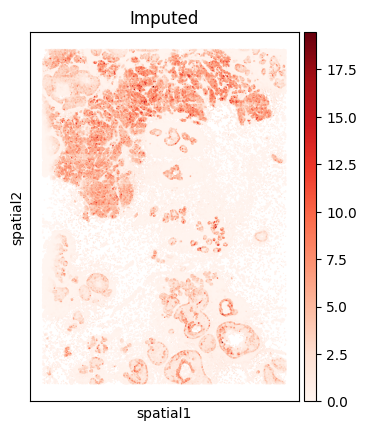

/tmp/ipykernel_142/4268571265.py:11: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(xe, color=[g], spot_size=30, title="Xenium Truth", color_map="Reds")


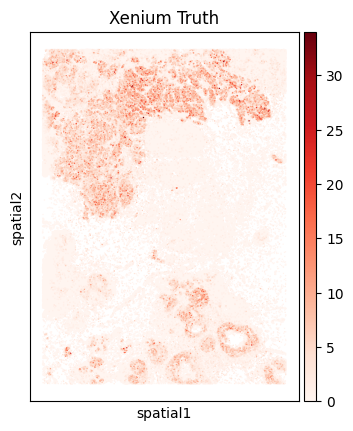

In [42]:
imputed_ad.obsm['spatial'] = xe.obsm['spatial']
g = holdouts[0] 
sc.pl.spatial(imputed_ad, color=[g], spot_size=30, title="Imputed", color_map="Reds")
sc.pl.spatial(xe, color=[g], spot_size=30, title="Xenium Truth", color_map="Reds")

In [48]:
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np

imputed_ad.obsm['spatial'] = xe.obsm['spatial']


common_holdouts = [g for g in holdouts if g in imputed_ad.var_names]
print(f"Generating plots for all {len(common_holdouts)} common holdout genes...")


for g in common_holdouts:
    
    gene_r2 = avg_corr_by_col(
        imputed_ad[:, [g]].X, 
        xe[:, [g]].X   
    )
    
   
    print(f"\nGene: {g} (R²: {gene_r2:.3f})") 
    

Generating plots for all 31 common holdout genes...

Gene: ABCC11 (R²: 0.371)

Gene: AQP1 (R²: 0.440)

Gene: C1QC (R²: 0.021)

Gene: CCL8 (R²: 0.018)

Gene: CD274 (R²: 0.020)

Gene: CD83 (R²: 0.072)

Gene: CENPF (R²: 0.172)

Gene: CRISPLD2 (R²: 0.410)

Gene: CXCR4 (R²: 0.402)

Gene: DSP (R²: 0.429)

Gene: ELF5 (R²: 0.004)

Gene: FBLIM1 (R²: 0.090)

Gene: FSTL3 (R²: 0.044)

Gene: HDC (R²: 0.006)

Gene: IL3RA (R²: 0.119)

Gene: KLRB1 (R²: 0.079)

Gene: KRT7 (R²: 0.757)

Gene: LPXN (R²: 0.182)

Gene: MKI67 (R²: 0.109)

Gene: MUC6 (R²: 0.001)

Gene: NOSTRIN (R²: 0.277)

Gene: PDGFRA (R²: 0.354)

Gene: POSTN (R²: 0.695)

Gene: RAMP2 (R²: 0.466)

Gene: SCD (R²: 0.493)

Gene: SFRP4 (R²: 0.232)

Gene: SOX17 (R²: 0.139)

Gene: TCEAL7 (R²: 0.052)

Gene: TIGIT (R²: 0.046)

Gene: TRAPPC3 (R²: 0.133)

Gene: ZEB1 (R²: 0.221)


Generating plots for all 31 common holdout genes...

Gene: ABCC11 (R²: 0.371)


/tmp/ipykernel_142/2635545072.py:30: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_142/2635545072.py:41: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


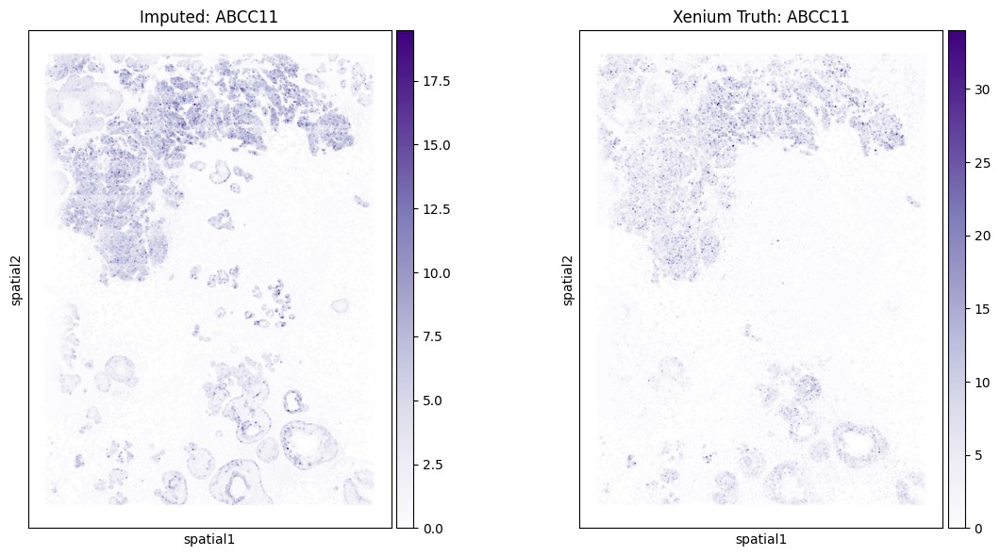


Gene: AQP1 (R²: 0.440)


/tmp/ipykernel_142/2635545072.py:30: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_142/2635545072.py:41: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


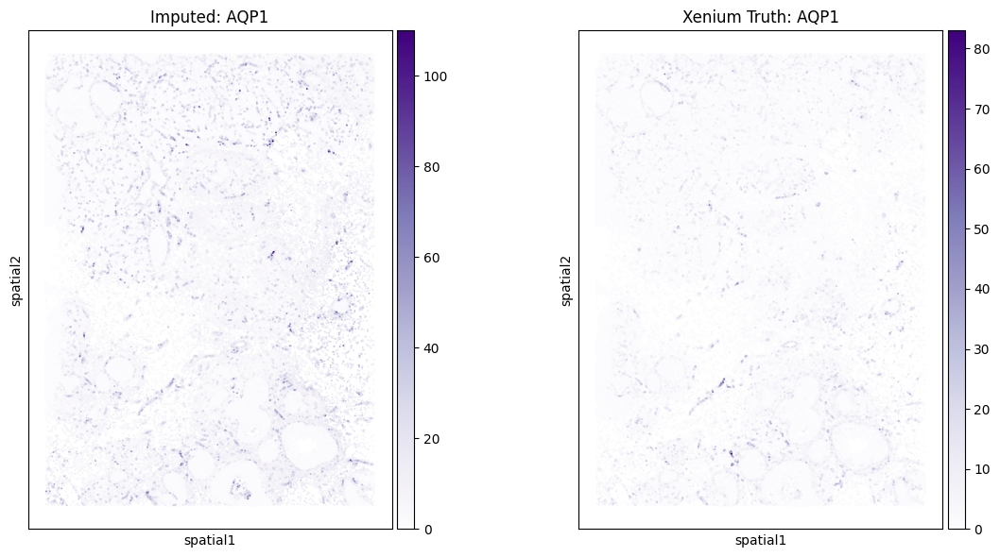


Gene: C1QC (R²: 0.021)


/tmp/ipykernel_142/2635545072.py:30: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_142/2635545072.py:41: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


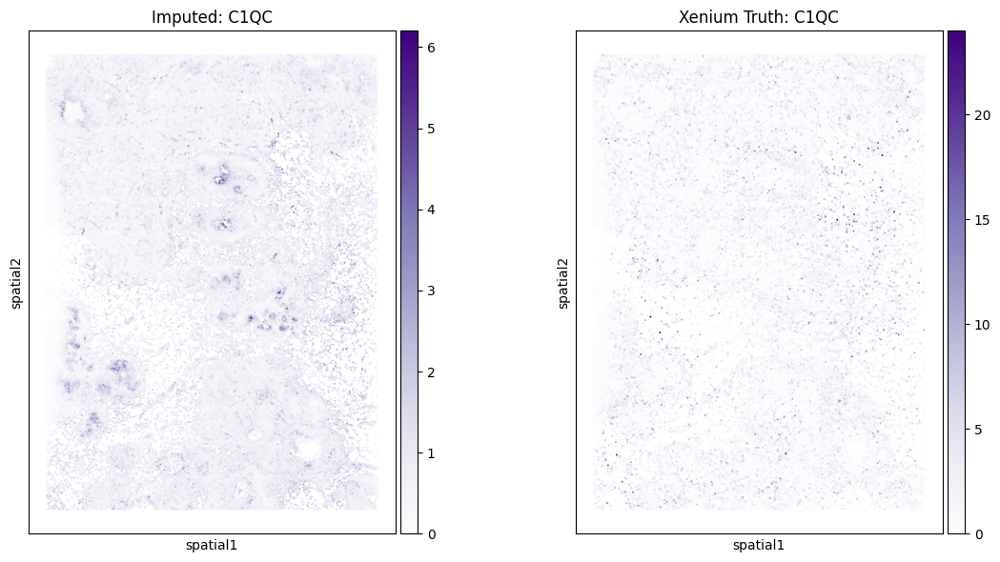


Gene: CCL8 (R²: 0.018)


/tmp/ipykernel_142/2635545072.py:30: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_142/2635545072.py:41: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


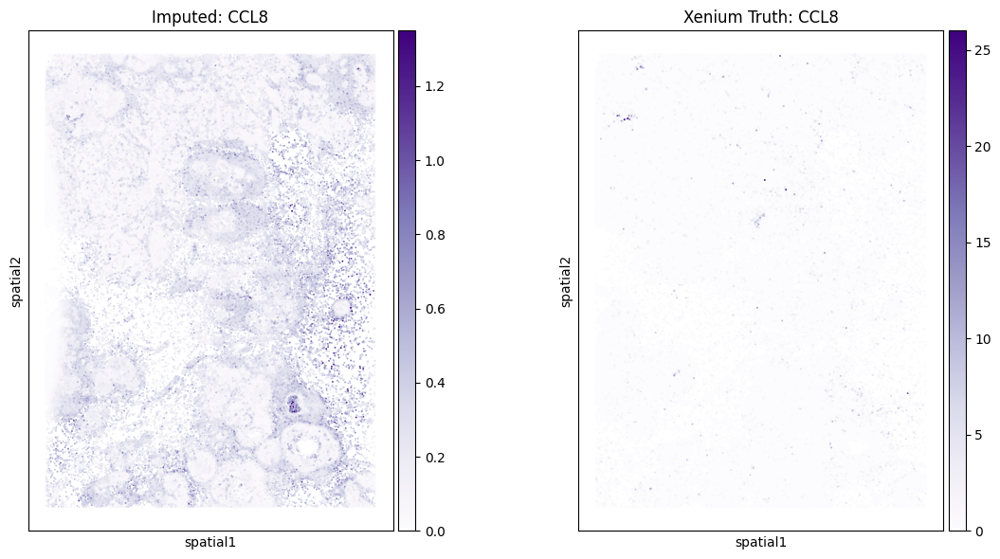


Gene: CD274 (R²: 0.020)


/tmp/ipykernel_142/2635545072.py:30: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_142/2635545072.py:41: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


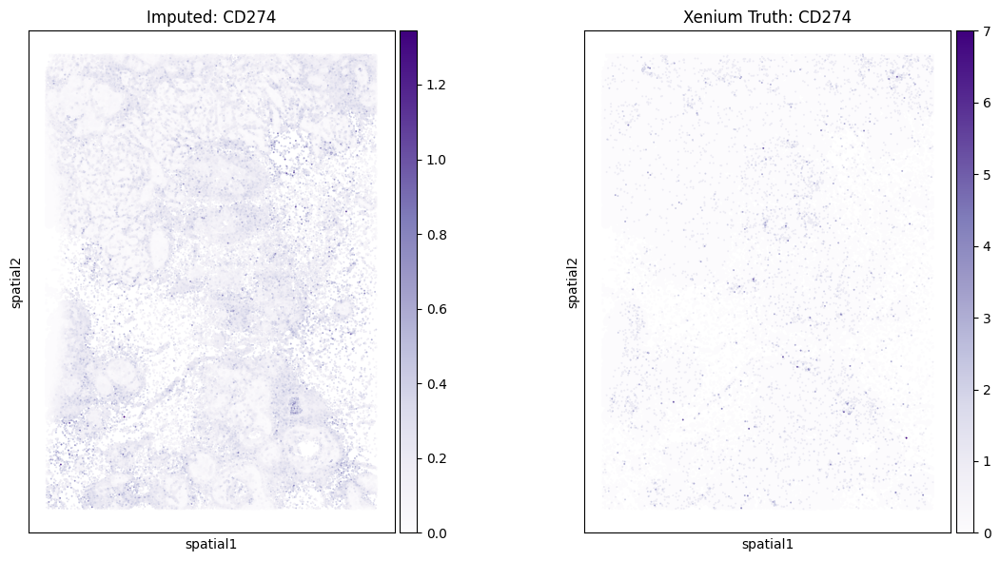


Gene: CD83 (R²: 0.072)


/tmp/ipykernel_142/2635545072.py:30: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_142/2635545072.py:41: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


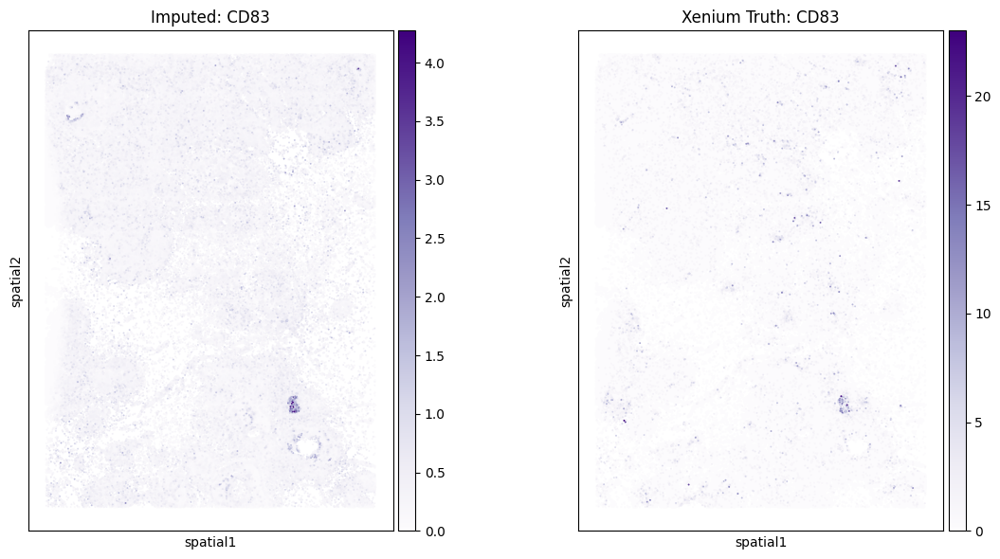


Gene: CENPF (R²: 0.172)


/tmp/ipykernel_142/2635545072.py:30: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_142/2635545072.py:41: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


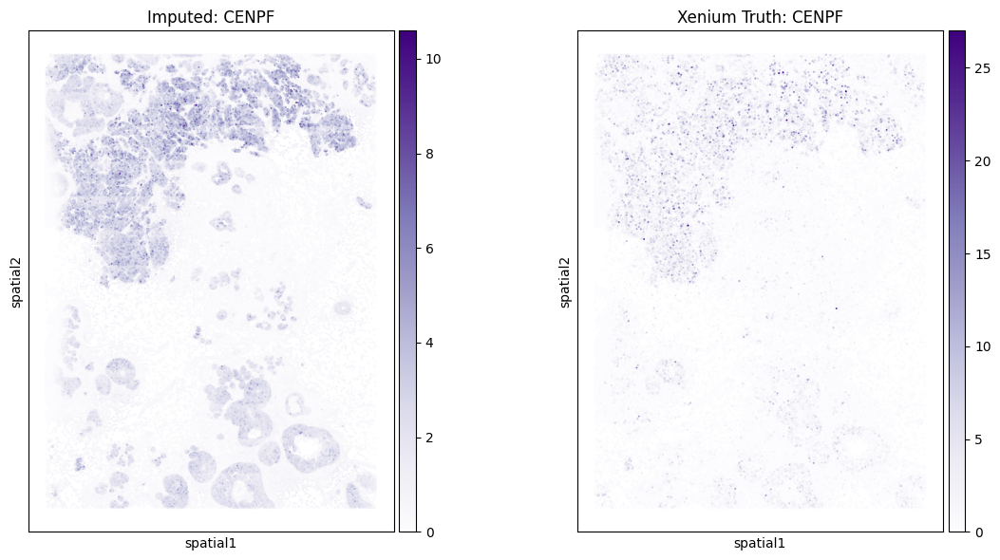


Gene: CRISPLD2 (R²: 0.410)


/tmp/ipykernel_142/2635545072.py:30: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_142/2635545072.py:41: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


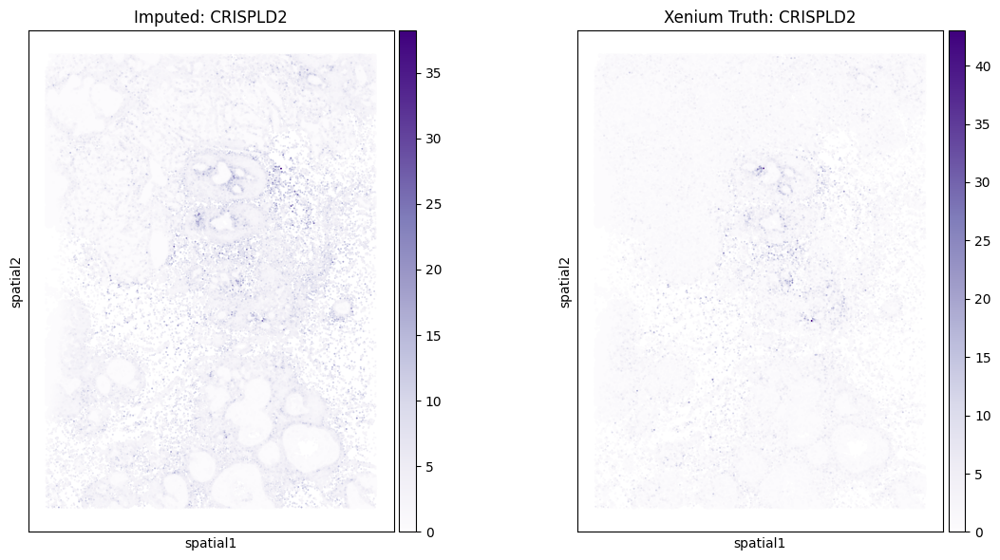


Gene: CXCR4 (R²: 0.402)


/tmp/ipykernel_142/2635545072.py:30: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_142/2635545072.py:41: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


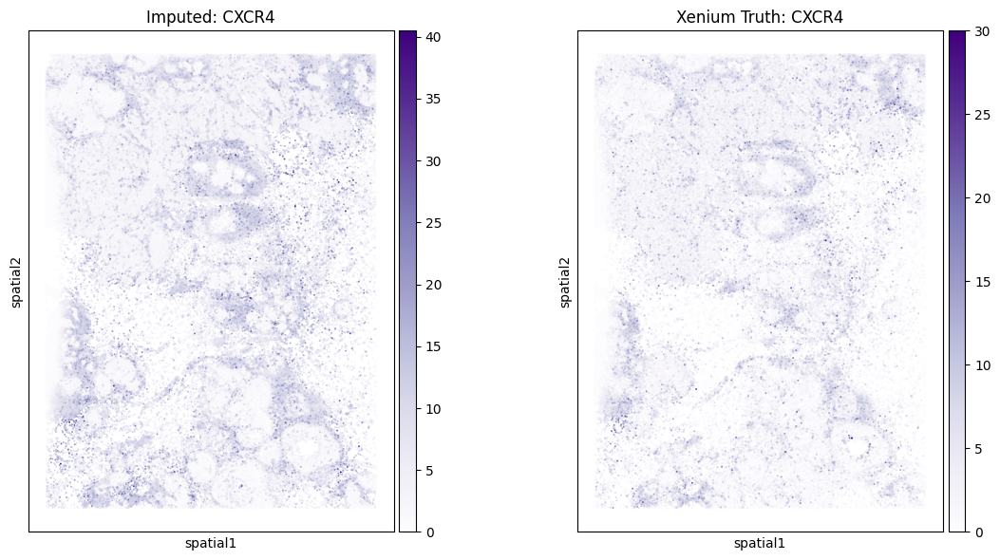


Gene: DSP (R²: 0.429)


/tmp/ipykernel_142/2635545072.py:30: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_142/2635545072.py:41: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


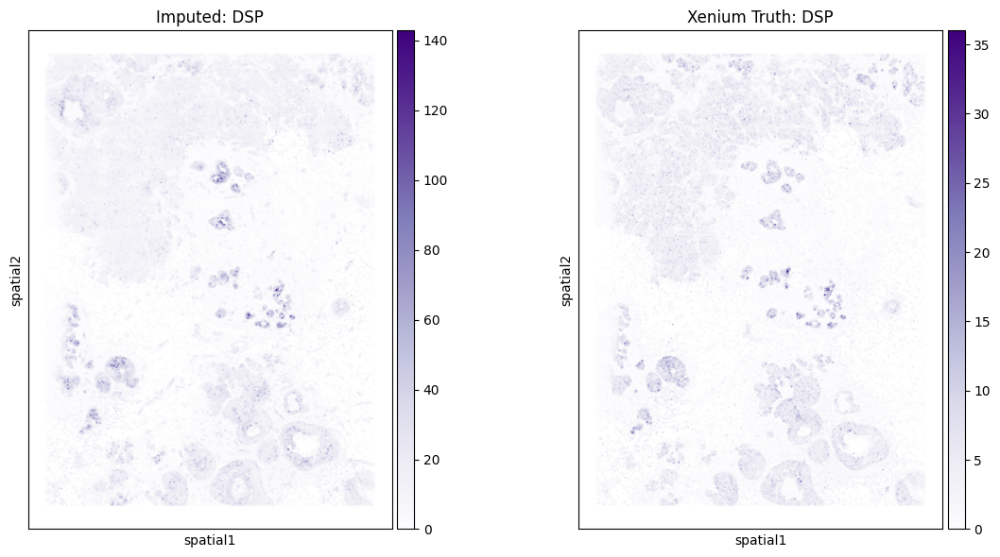


Gene: ELF5 (R²: 0.004)


/tmp/ipykernel_142/2635545072.py:30: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_142/2635545072.py:41: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


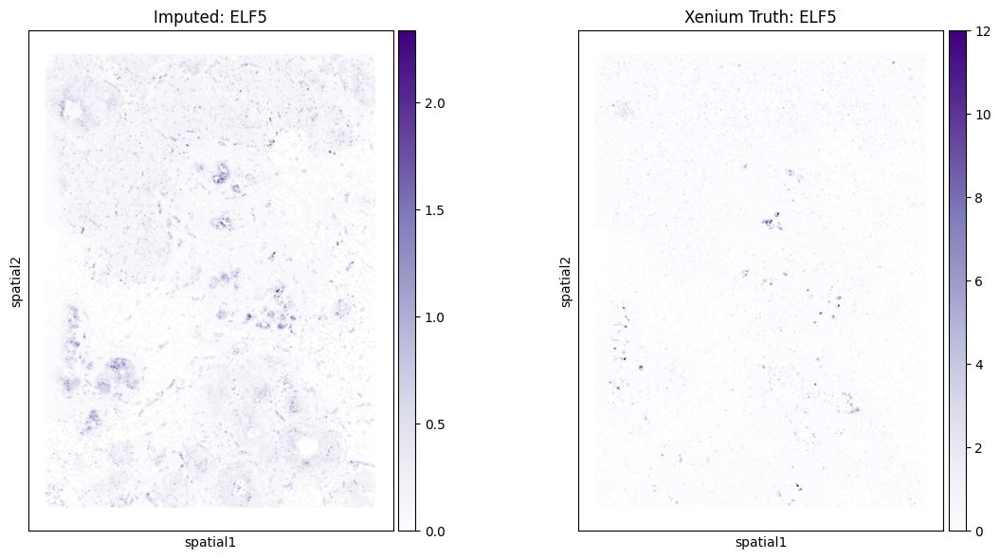


Gene: FBLIM1 (R²: 0.090)


/tmp/ipykernel_142/2635545072.py:30: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_142/2635545072.py:41: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


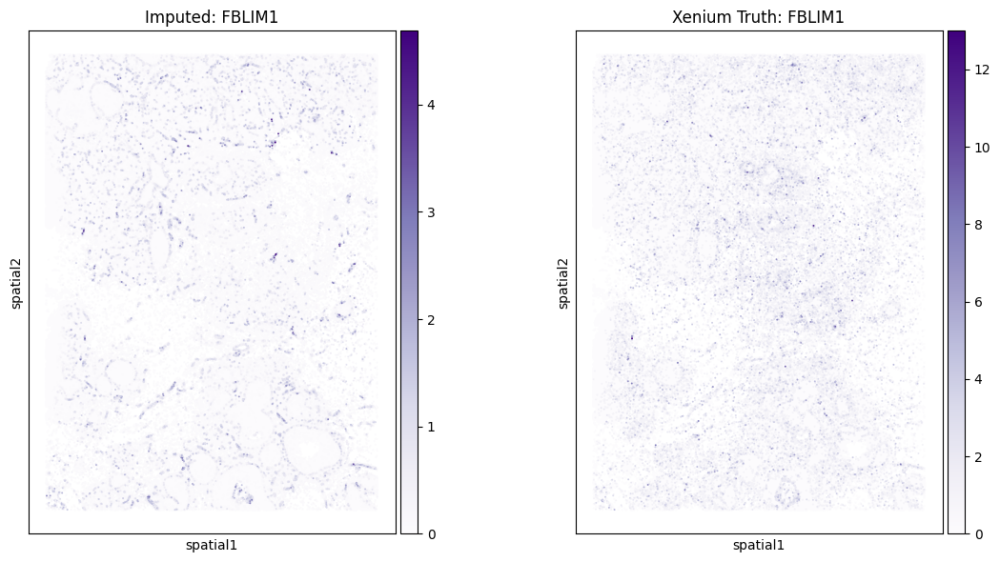


Gene: FSTL3 (R²: 0.044)


/tmp/ipykernel_142/2635545072.py:30: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_142/2635545072.py:41: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


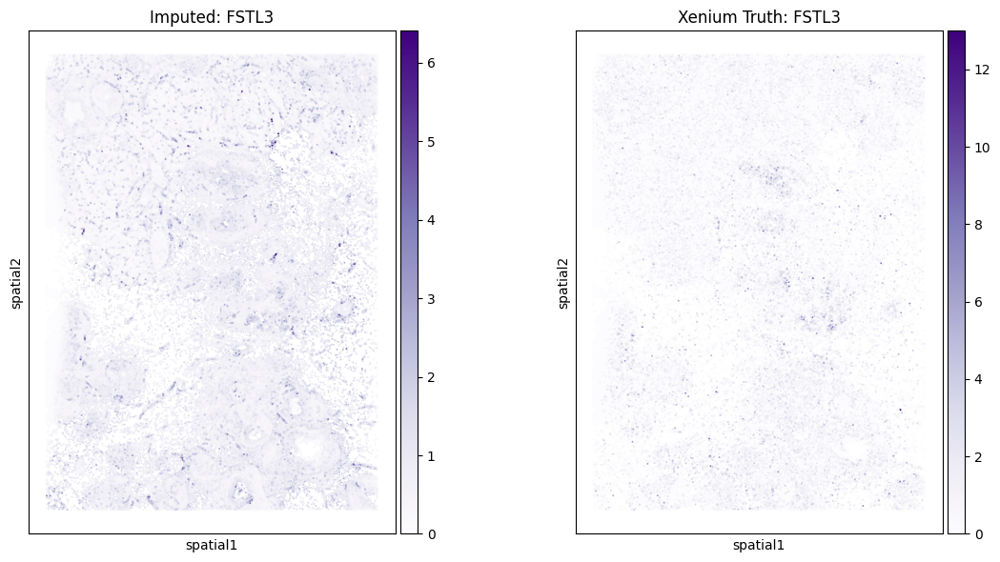


Gene: HDC (R²: 0.006)


/tmp/ipykernel_142/2635545072.py:30: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_142/2635545072.py:41: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


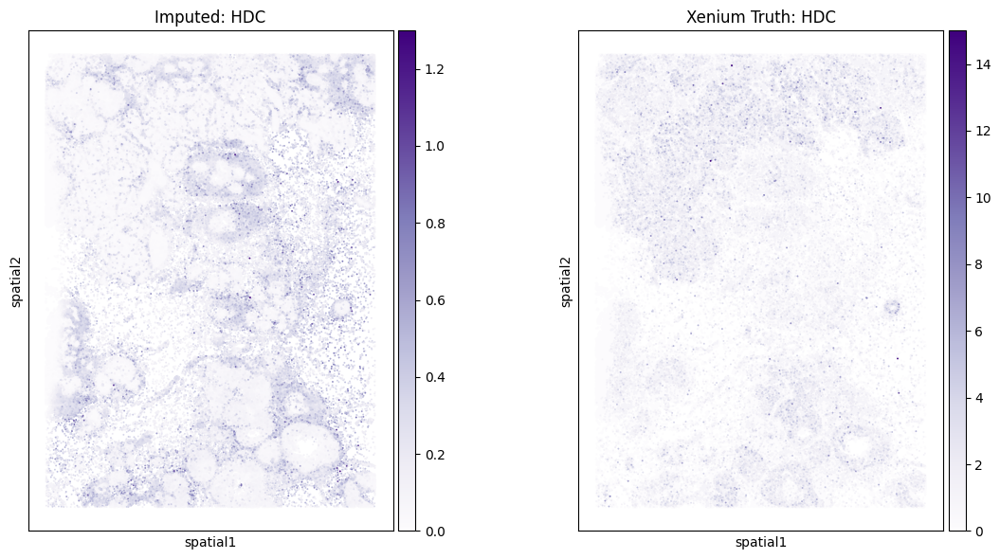


Gene: IL3RA (R²: 0.119)


/tmp/ipykernel_142/2635545072.py:30: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_142/2635545072.py:41: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


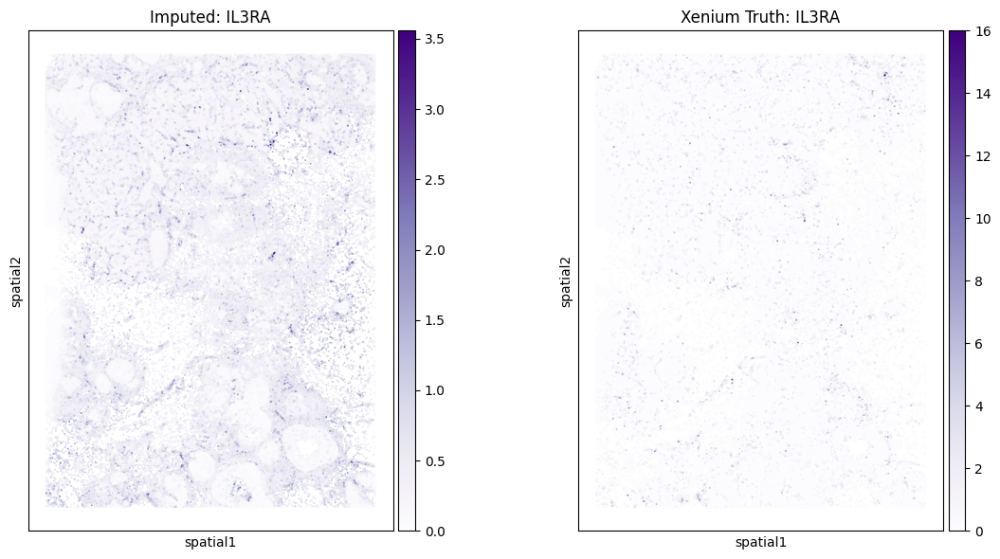


Gene: KLRB1 (R²: 0.079)


/tmp/ipykernel_142/2635545072.py:30: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_142/2635545072.py:41: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


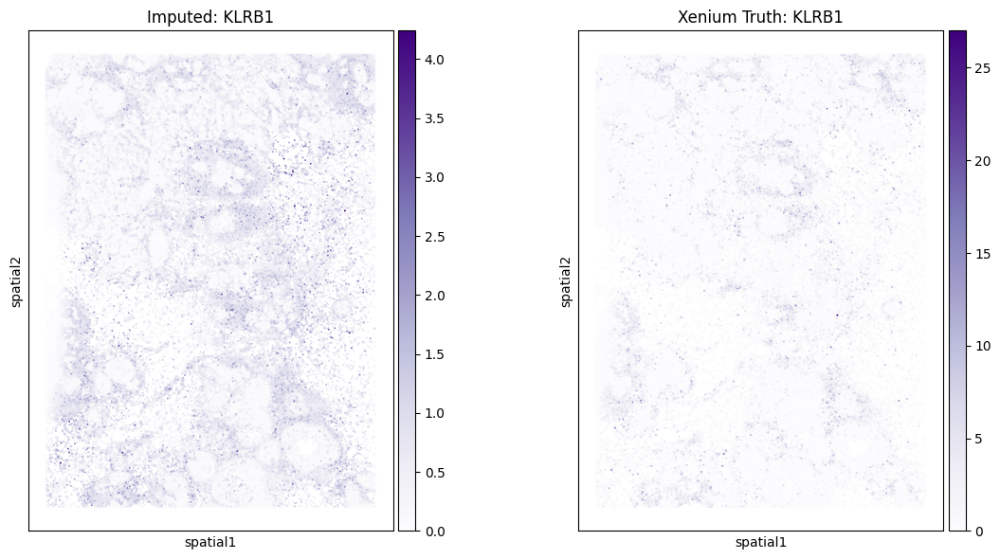


Gene: KRT7 (R²: 0.757)


/tmp/ipykernel_142/2635545072.py:30: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_142/2635545072.py:41: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


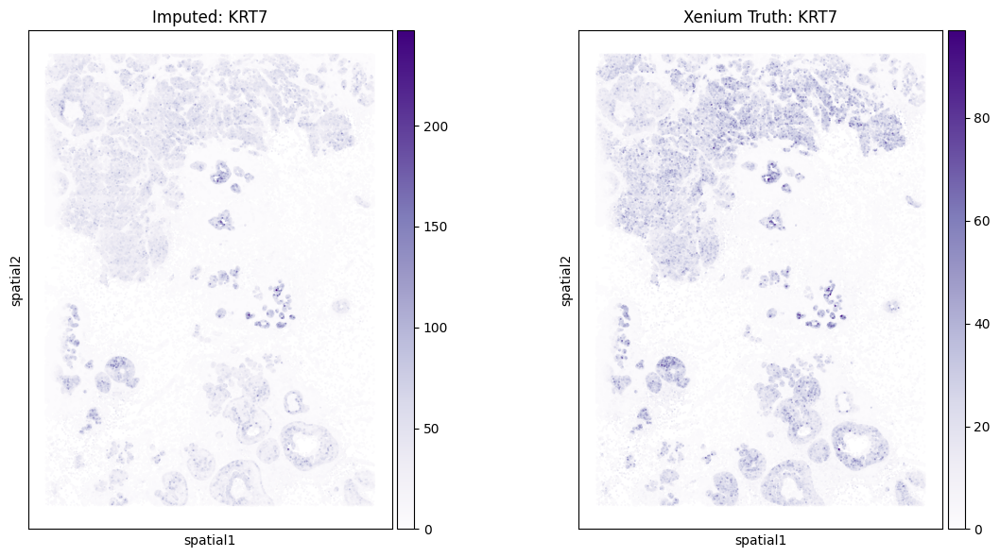


Gene: LPXN (R²: 0.182)


/tmp/ipykernel_142/2635545072.py:30: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_142/2635545072.py:41: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


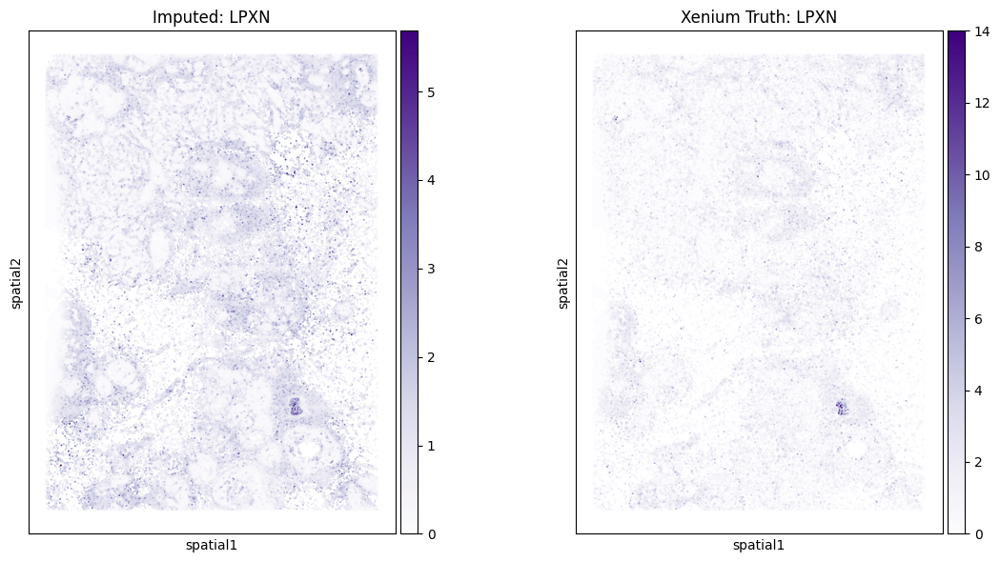


Gene: MKI67 (R²: 0.109)


/tmp/ipykernel_142/2635545072.py:30: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_142/2635545072.py:41: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


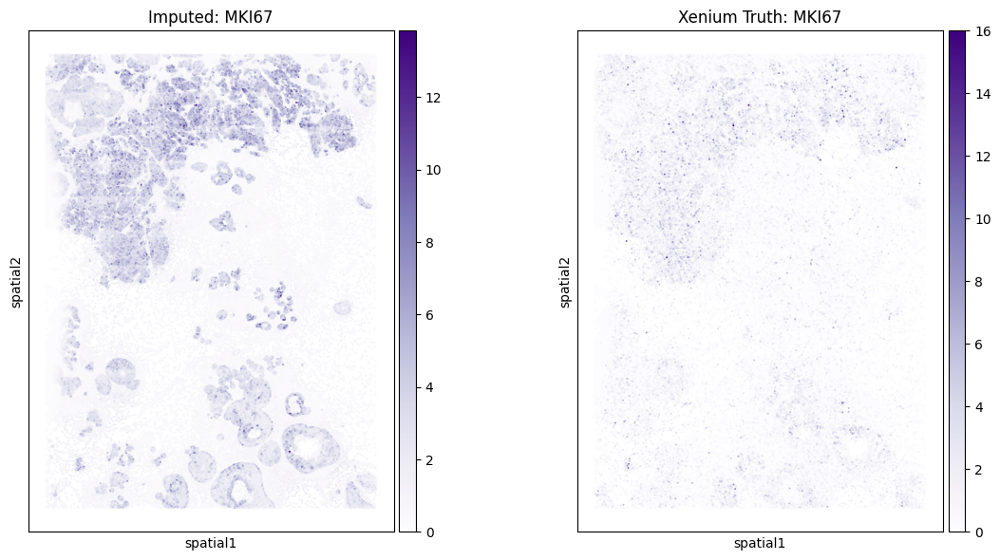


Gene: MUC6 (R²: 0.001)


/tmp/ipykernel_142/2635545072.py:30: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_142/2635545072.py:41: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


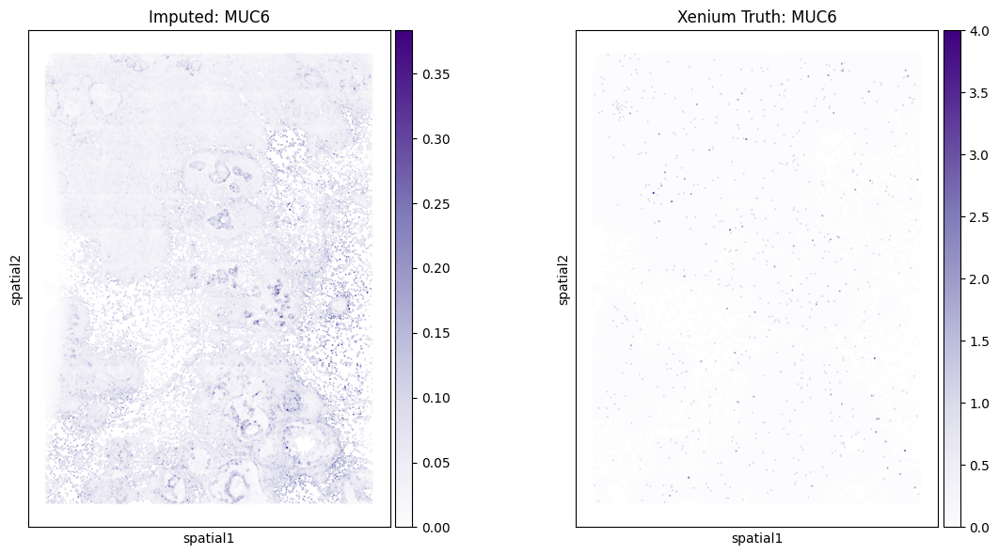


Gene: NOSTRIN (R²: 0.277)


/tmp/ipykernel_142/2635545072.py:30: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_142/2635545072.py:41: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


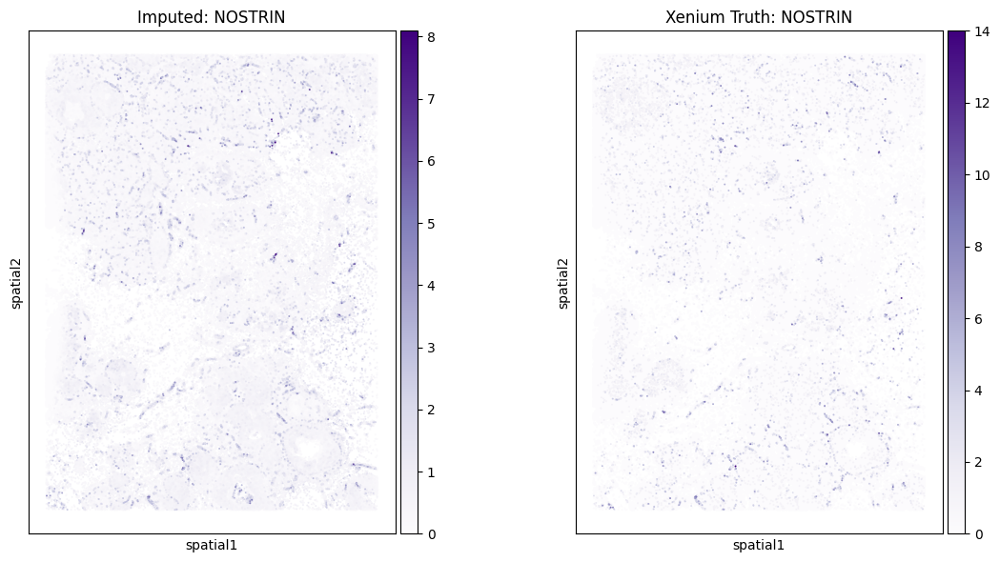


Gene: PDGFRA (R²: 0.354)


/tmp/ipykernel_142/2635545072.py:30: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_142/2635545072.py:41: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


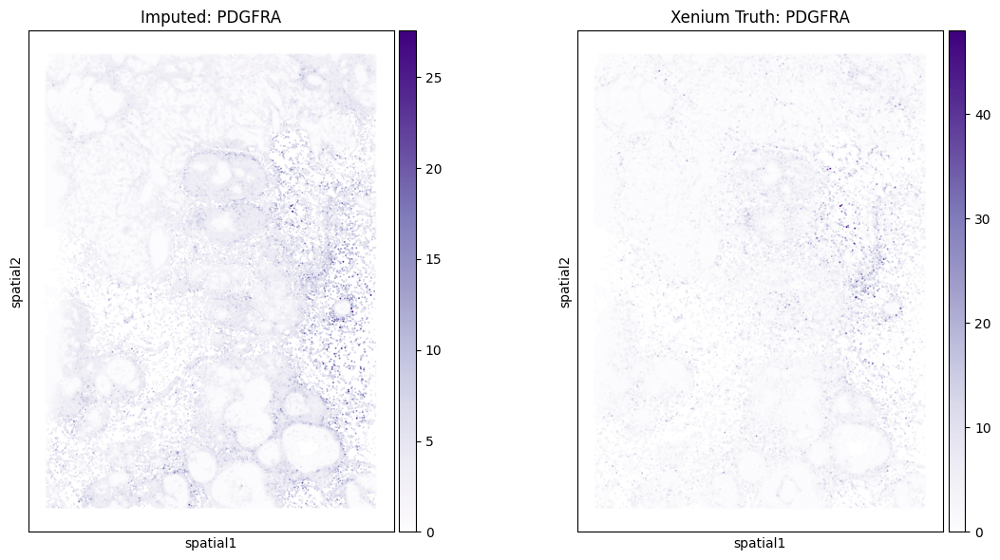


Gene: POSTN (R²: 0.695)


/tmp/ipykernel_142/2635545072.py:30: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_142/2635545072.py:41: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


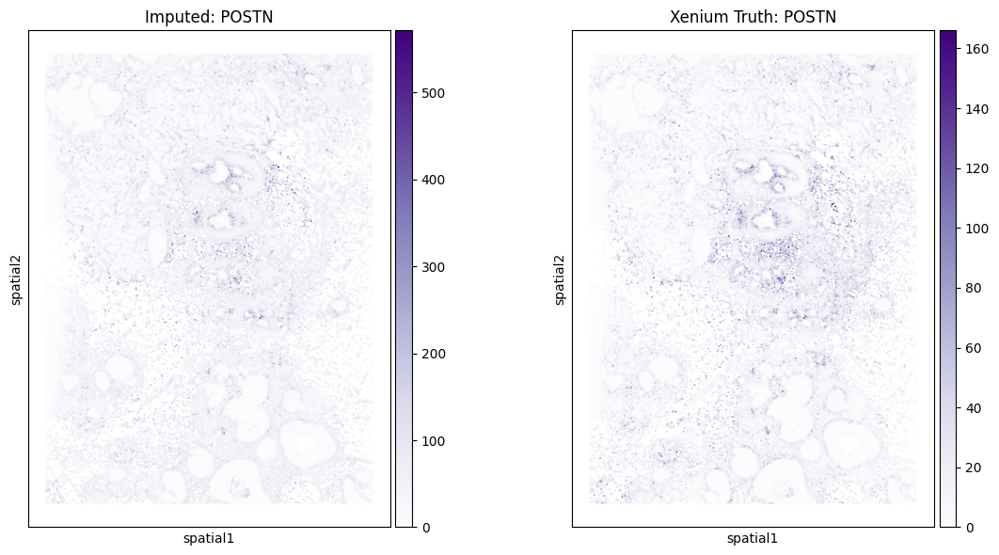


Gene: RAMP2 (R²: 0.466)


/tmp/ipykernel_142/2635545072.py:30: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_142/2635545072.py:41: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


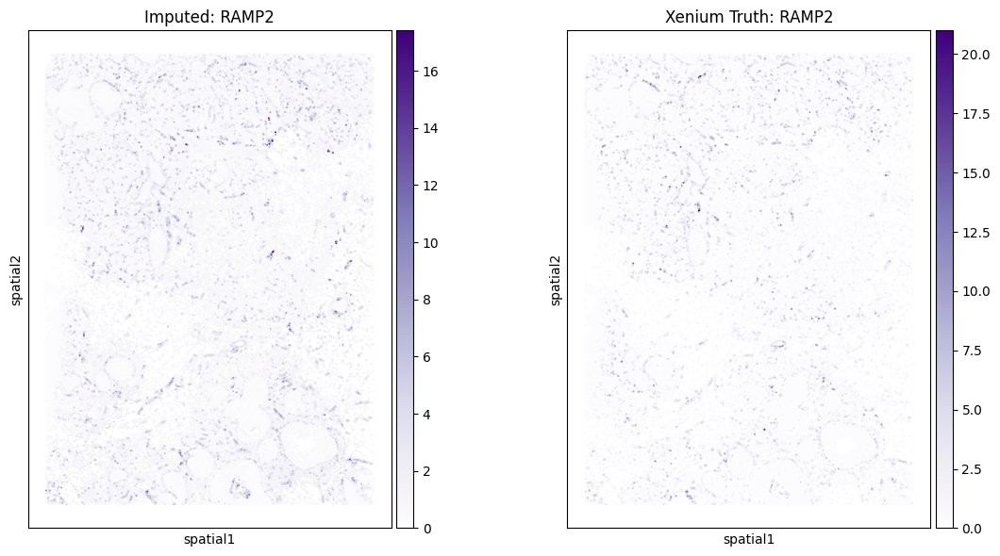


Gene: SCD (R²: 0.493)


/tmp/ipykernel_142/2635545072.py:30: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_142/2635545072.py:41: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


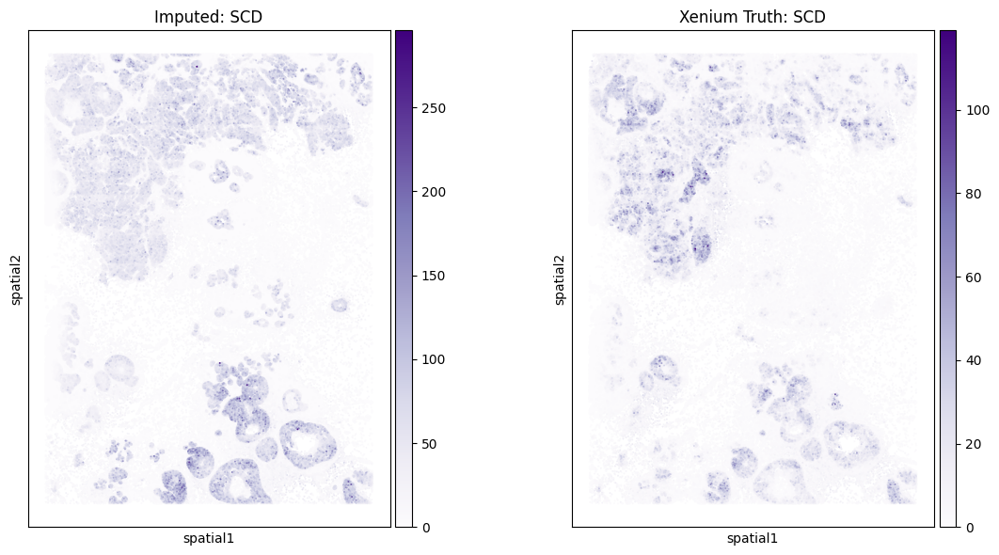


Gene: SFRP4 (R²: 0.232)


/tmp/ipykernel_142/2635545072.py:30: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_142/2635545072.py:41: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


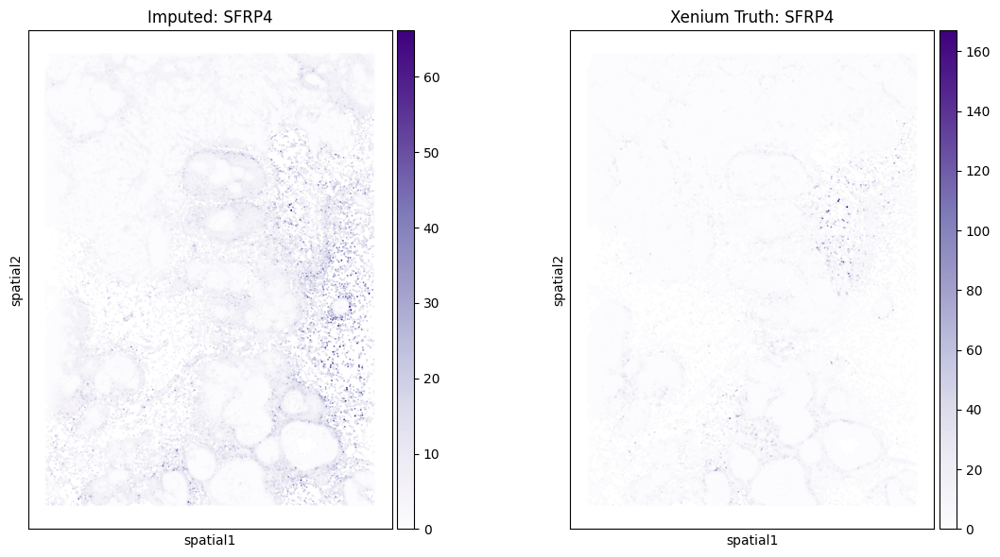


Gene: SOX17 (R²: 0.139)


/tmp/ipykernel_142/2635545072.py:30: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_142/2635545072.py:41: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


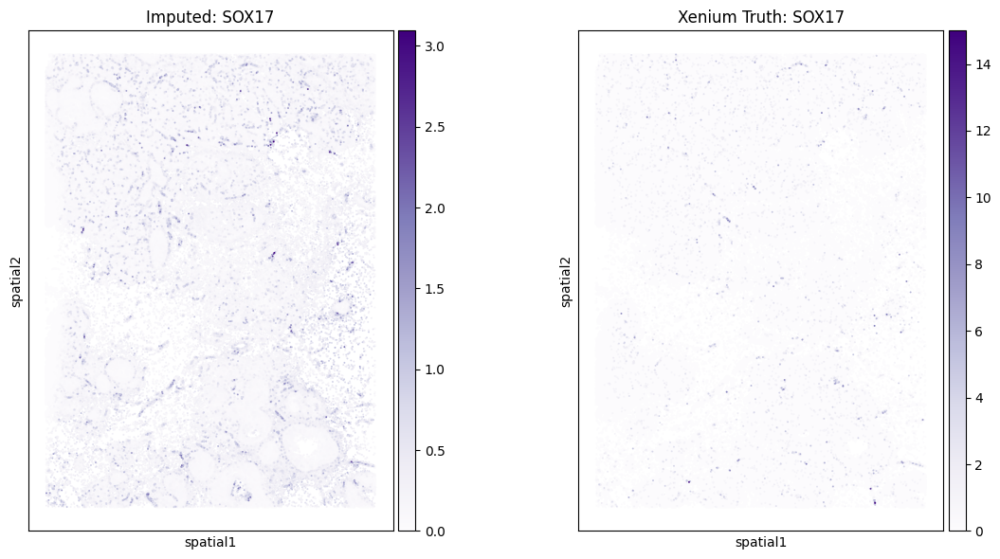


Gene: TCEAL7 (R²: 0.052)


/tmp/ipykernel_142/2635545072.py:30: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_142/2635545072.py:41: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


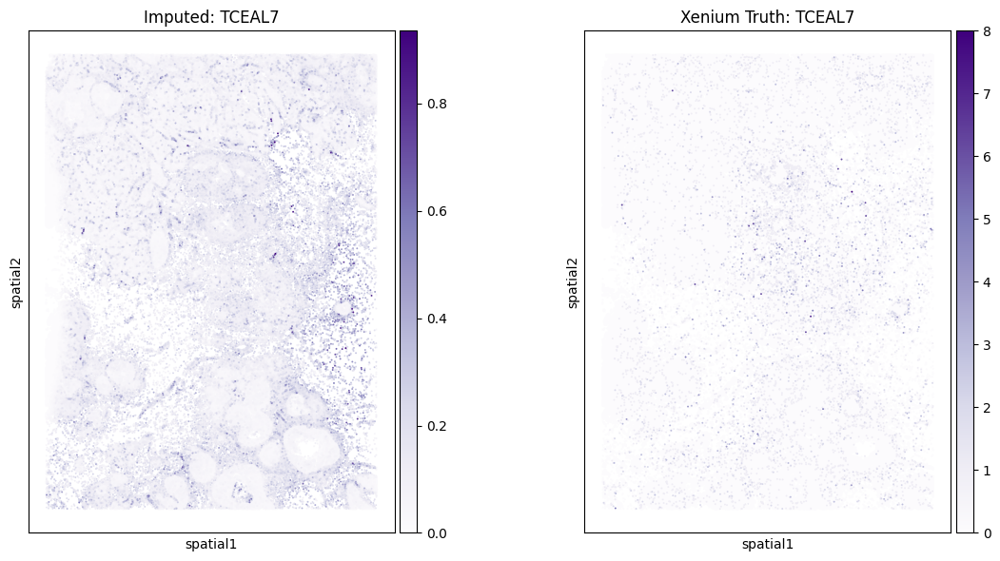


Gene: TIGIT (R²: 0.046)


/tmp/ipykernel_142/2635545072.py:30: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_142/2635545072.py:41: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


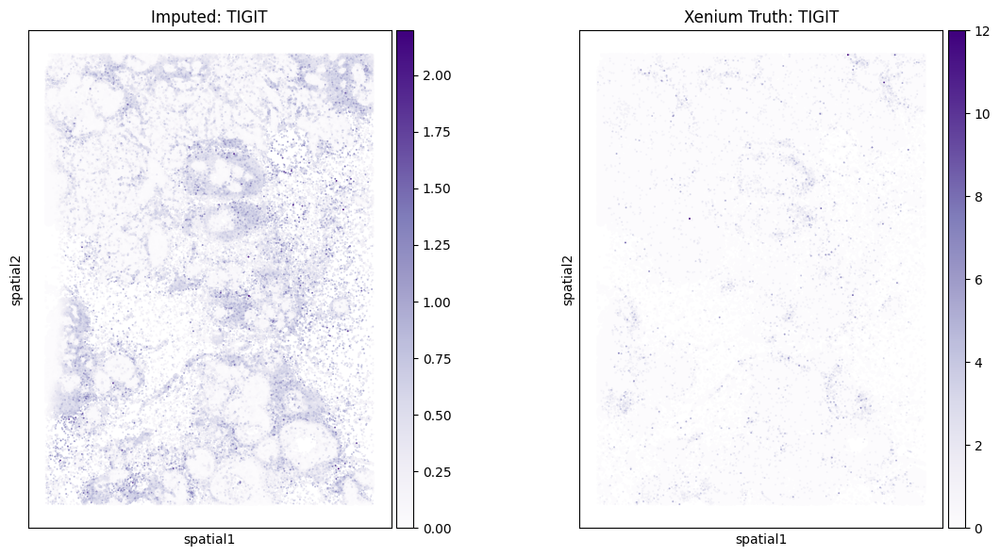


Gene: TRAPPC3 (R²: 0.133)


/tmp/ipykernel_142/2635545072.py:30: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_142/2635545072.py:41: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


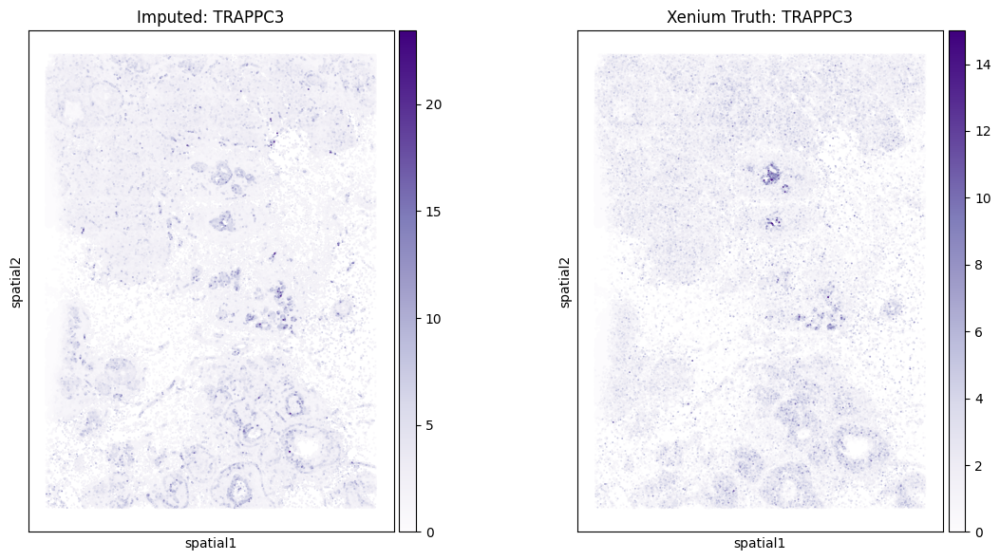


Gene: ZEB1 (R²: 0.221)


/tmp/ipykernel_142/2635545072.py:30: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_142/2635545072.py:41: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


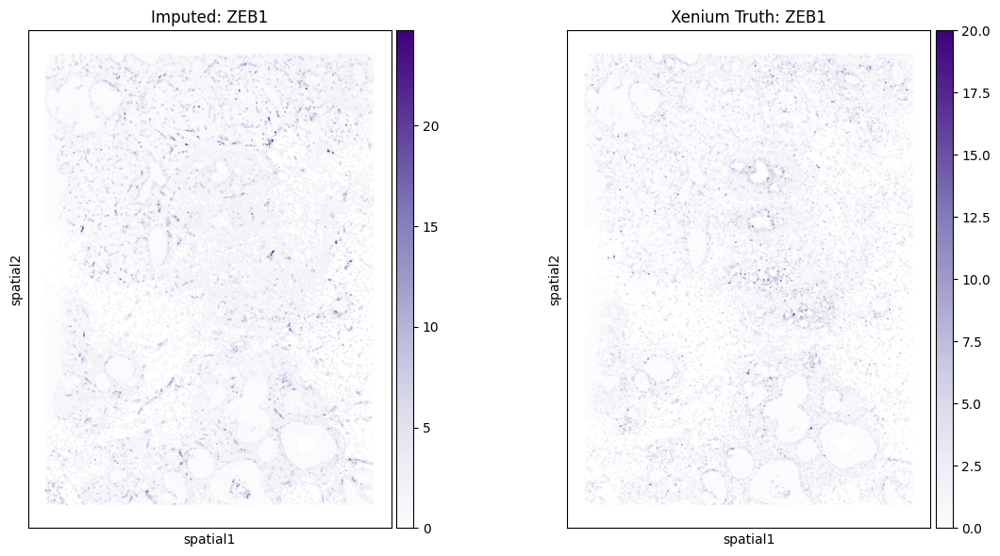


All plots generated.


In [46]:
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np

imputed_ad.obsm['spatial'] = xe.obsm['spatial']

common_holdouts = [g for g in holdouts if g in imputed_ad.var_names]
print(f"Generating plots for all {len(common_holdouts)} common holdout genes...")


for g in common_holdouts:
    
    
    gene_r2 = avg_corr_by_col(
        imputed_ad[:, [g]].X, 
        xe[:, [g]].X   
    )
    
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    
    print(f"\nGene: {g} (R²: {gene_r2:.3f})") 
    
    sc.pl.spatial(
        imputed_ad, 
        color=[g], 
        spot_size=30, 
        title=f"Imputed: {g}", 
        color_map="Purples",
        ax=axes[0],
        show=False
    )
    
    sc.pl.spatial(
        xe, 
        color=[g], 
        spot_size=30, 
        title=f"Xenium Truth: {g}", 
        color_map="Purples",
        ax=axes[1],
        show=False
    )
    
    plt.tight_layout()
    plt.show()

print("\nAll plots generated.")